In [ ]:
!pip install roboflow
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.6 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=3a5061e70cc2fe80981d28e0f71258c219c8ac5001d8461f9b162bb2c1d2858b
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 609.4/609.4 kB 11.6 MB/s eta 0:00:00


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

from ultralytics import YOLO

In [ ]:
from roboflow import Roboflow

rf = Roboflow(api_key="kbd6QsOts5bi6f9ABpMF", model_format='yolov8')
project = rf.workspace("yolo-vuyol").project("animal_detection2-bazzt")
dataset = project.version(1).download(location='/content/my-datasets')

loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to /content/my-datasets in yolov8:: 100%|██████████| 1982/1982 [00:00<00:00, 2673.75it/s]


In [ ]:
model = YOLO('yolov8n.pt')

model.train(data='/content/my-datasets/data.yaml', epochs=100)

100%|██████████| 6.23M/6.23M [00:01<00:00, 5.82MB/s]
Ultralytics YOLOv8.0.159 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/my-datasets/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, f

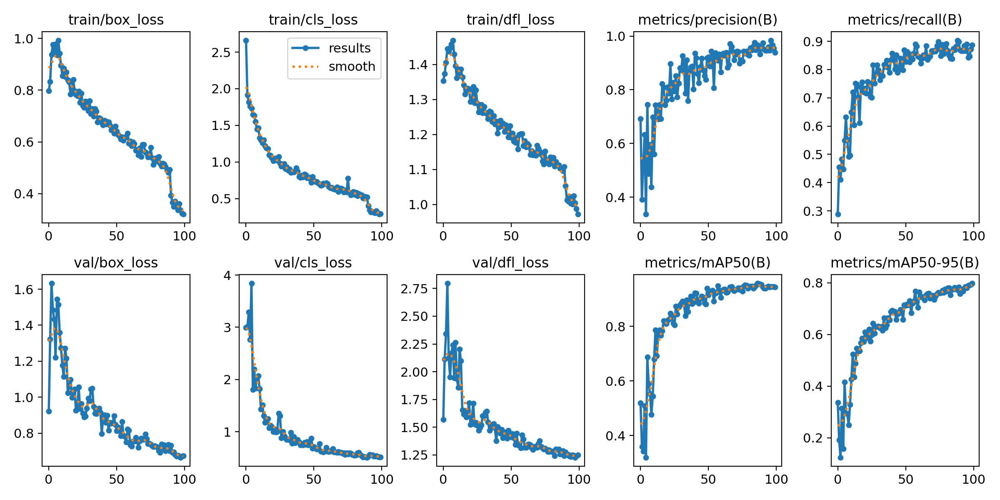

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

results_graph = cv2.imread('/content/runs/detect/train/results.png')

cv2_imshow(results_graph)

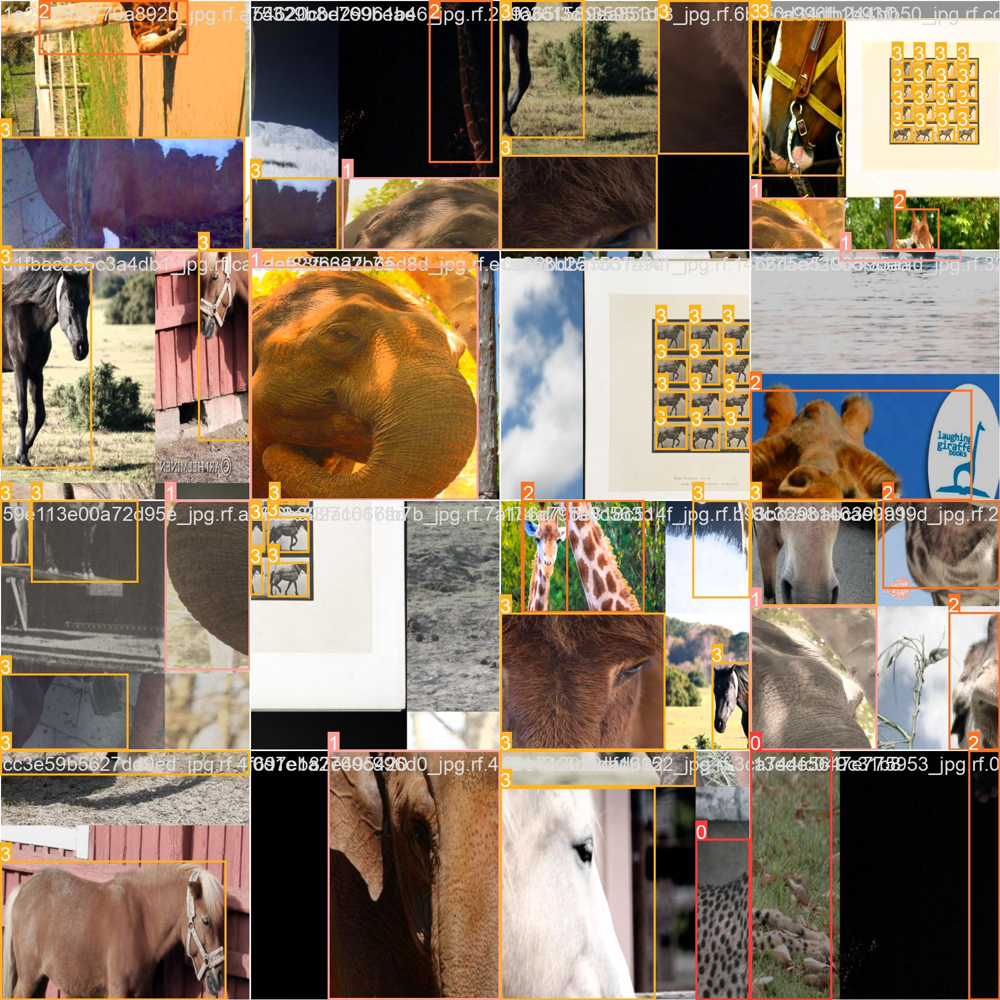

In [ ]:
train_batch = cv2.imread('/content/runs/detect/train/train_batch2.jpg')

cv2_imshow(train_batch)

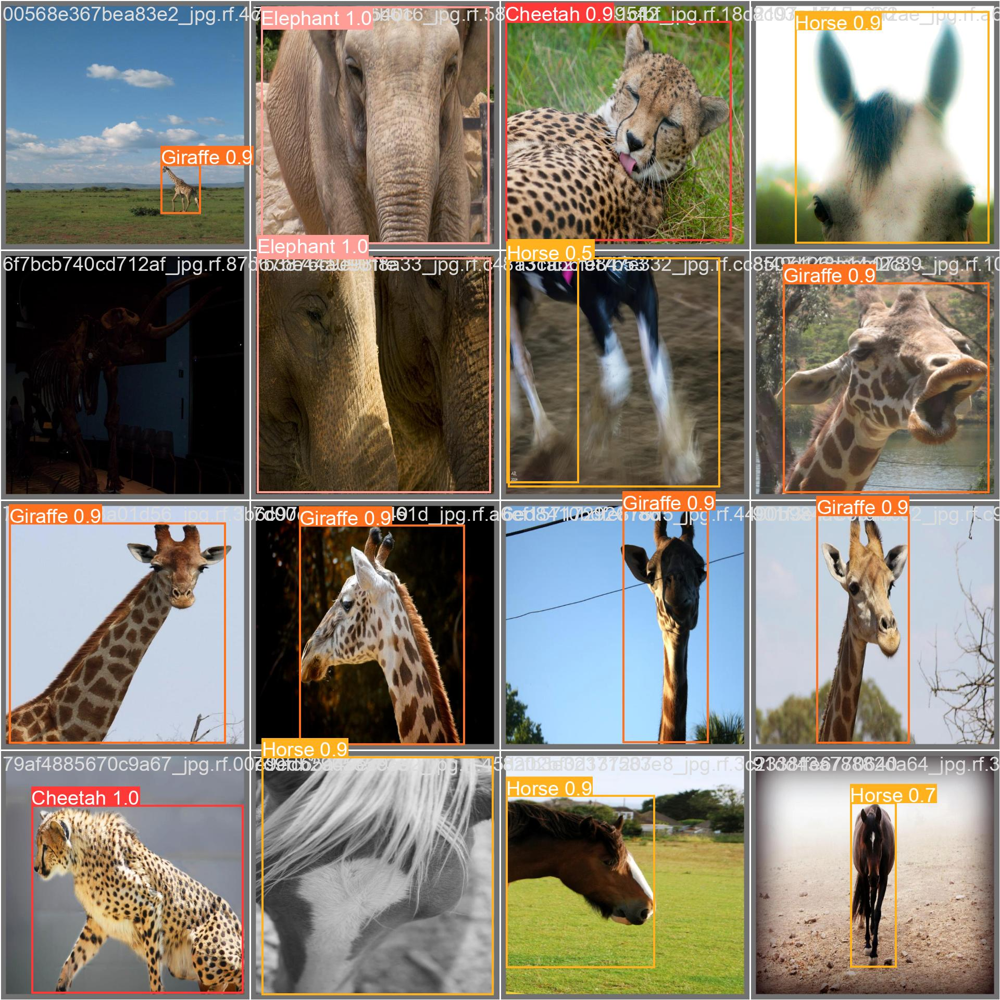

In [ ]:
val_batch = cv2.imread('/content/runs/detect/train/val_batch0_pred.jpg')

cv2_imshow(val_batch)

In [33]:
image = cv2.imread('/content/my-datasets/test/images/051240bc1540c767_jpg.rf.899661580e875f8d6b597c5d68021328.jpg')
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

results = model.predict(source=image)


0: 640x640 1 Elephant, 1 Horse, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Object type: Horse
Coordinates: [51, 43, 613, 609]
Probability: 0.8
---
Object type: Elephant
Coordinates: [60, 85, 524, 606]
Probability: 0.5
---


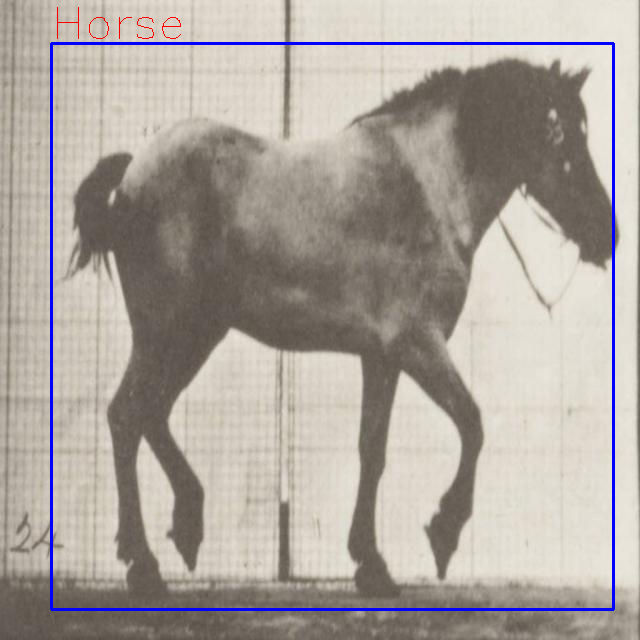

In [34]:
for i in range(len(results)):
  result = results[i]

  for box in result.boxes:
    class_id = result.names[box.cls[0].item()]
    cords = box.xyxy[0].tolist()
    cords = [round(x) for x in cords]
    conf = round(box.conf[0].item(), 2)
    print("Object type:", class_id)
    print("Coordinates:", cords)
    print("Probability:", conf)

    x1, y1, x2, y2 = cords
    if conf > 0.5:
      cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
      cv2.putText(image, text=str(class_id), org=(x1, y1 - 5), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.5, color=(0, 0, 255), thickness=1)

    print("---")

cv2_imshow(image)